<a href="https://colab.research.google.com/github/Haque14/MSE504/blob/main/Final_Part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Name: Md Ershadul Haque

Department: Mechanical, Aerospace, and Biomedical Engineering

# II. What's in that image?

Analysis of metallographic images by the variational autoencoder (VAE) based segmentation.
- Data by Vivek Chawla

In [1]:
!gdown https://drive.google.com/file/d/12c2C-tGC5JQBgoLJvHNLl8MPnuWamell/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=12c2C-tGC5JQBgoLJvHNLl8MPnuWamell
To: /content/Main image_C-Laser DIC_20241119170035.png
100% 4.00M/4.00M [00:00<00:00, 91.1MB/s]


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_name = '/content/Main image_C-Laser DIC_20241119170035.png'
color_image = cv2.imread(image_name)
image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
print(f'dtype: {image.dtype}, shape: {image.shape}, min: {np.min(image)}, max: {np.max(image)}')

height, width = image.shape
# Calculate the cropping coordinates
crop_height = height - 200
# Crop the image
cropped_image = image[:crop_height, :]
#cropped_image = image[800:, 250:850]

# optional CLAHE
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(200, 200))
image = clahe.apply(cropped_image)

dtype: uint8, shape: (1536, 2048), min: 0, max: 255


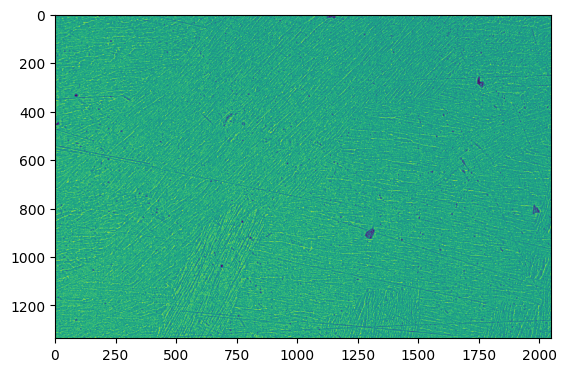

In [3]:
plt.imshow(image)

The metallograpic image clearly has the regions visible to human eye. Build the ML image analysis workflow that will allow segmenting the image into visible regions. The strategies you can explore are:
1. Image featurization - e.g. edge finding
2. Sliding widow feature fuilding vs. keypoitn detection
3. Human heuristic - defining features (note that ChatGPT can be very helpful)
4. Dimensionality reduction
5. Have fun!

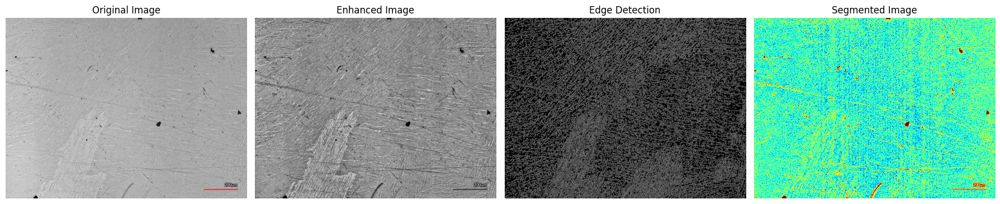

Segmented image saved to: segmented_metallographic_image.png


In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Load Image
image_name = '/content/Main image_C-Laser DIC_20241119170035.png'
color_image = cv2.imread(image_name)

if color_image is None:
    raise FileNotFoundError(f"Image not found: {image_name}")

# Convert to Grayscale
gray_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)

# Step 1: Preprocessing
# Apply CLAHE for contrast enhancement
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
enhanced_image = clahe.apply(gray_image)

# Gaussian Blur for noise reduction
blurred_image = cv2.GaussianBlur(enhanced_image, (5, 5), 0)

# Step 2: Edge Detection
edges = cv2.Canny(blurred_image, 100, 200)

# Step 3: Feature Extraction
# Texture analysis with Local Binary Patterns (LBP)
def compute_lbp(image):
    lbp_image = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(1, rows - 1):
        for j in range(1, cols - 1):
            center = image[i, j]
            binary_str = ''.join(['1' if image[i + di, j + dj] > center else '0'
                                  for di, dj in [(-1, -1), (-1, 0), (-1, 1), (0, -1),
                                                 (0, 1), (1, -1), (1, 0), (1, 1)]])
            lbp_image[i, j] = int(binary_str, 2)
    return lbp_image

lbp_image = compute_lbp(enhanced_image)

# Step 4: Dimensionality Reduction
# Reshape and reduce dimensions using PCA
reshaped_image = enhanced_image.reshape(-1, 1)
pca = PCA(n_components=1)
reduced_features = pca.fit_transform(reshaped_image)

# Step 5: Clustering
# K-Means Clustering for segmentation
n_clusters = 3  # Define the number of visible regions
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(reduced_features)

# Reshape the clustered labels back to the image dimensions
segmented_image = labels.reshape(gray_image.shape)

# Step 6: Post-Processing
# Apply morphological closing to refine segmentation
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
refined_segmentation = cv2.morphologyEx(segmented_image.astype(np.uint8), cv2.MORPH_CLOSE, kernel)

# Step 7: Visualization
plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1, 4, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Enhanced Image
plt.subplot(1, 4, 2)
plt.title("Enhanced Image")
plt.imshow(enhanced_image, cmap='gray')
plt.axis('off')

# Edge Detection
plt.subplot(1, 4, 3)
plt.title("Edge Detection")
plt.imshow(edges, cmap='gray')
plt.axis('off')

# Segmented Image
plt.subplot(1, 4, 4)
plt.title("Segmented Image")
plt.imshow(segmented_image, cmap='jet')
plt.axis('off')

plt.tight_layout()
plt.show()

# Save the segmented image
output_path = 'segmented_metallographic_image.png'
cv2.imwrite(output_path, (segmented_image * (255 // n_clusters)).astype(np.uint8))
print(f"Segmented image saved to: {output_path}")


An example of possible answer:

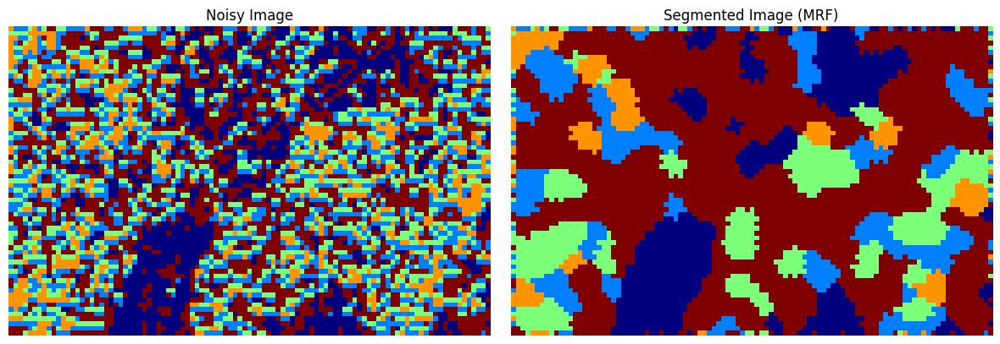

# III. Causality in materials science

III.1. Explain the concept of causality and its significance in understanding material properties and behaviors.

Answer:

**Causality: The Concept**

Causality refers to the relationship between causes and effects, where a specific action or condition (cause) directly leads to an outcome (effect). In the context of materials science, causality is the framework for understanding how the intrinsic and extrinsic factors of a material influence its properties and behavior.

For example:

* **Cause:** The addition of carbon to iron during steel production.
* **Effect:** Increased hardness and strength due to changes in the material's microstructure.

Understanding causality enables scientists and engineers to predict and control material performance, troubleshoot failures, and design innovative materials tailored for specific applications.


# Significance of Causality in Understanding Material Properties and Behaviors
Causality is fundamental to materials science because it allows researchers and engineers to understand, predict, and control the properties and behaviors of materials. By identifying cause-and-effect relationships, scientists can determine how different factors influence material performance and use this knowledge to design materials for specific applications. Here are the key significances:

**1. Establishing Structure-Property Relationships**
* Description: The intrinsic structure of a material (atomic, micro, or macro level) determines its properties.
* Significance: Predict how changes in atomic bonding, crystal structure, or microstructure affect material performance. For example, the hardness of a metal is causally linked to its grain size, as smaller grains impede dislocation movement (Hall-Petch relationship).
* Applications: Design of advanced materials like high-strength steels or lightweight composites.

**2. Linking Processing to Properties**
* Description: The way a material is processed directly impacts its structure, which in turn affects its properties.
* Significance: Enables optimization of manufacturing processes to achieve desired material performance. For example, quenching steel creates a martensitic structure, making it harder but more brittle.
* Applications: Heat treatment, alloying, and additive manufacturing.

**3. Predicting Behavior Under External Conditions**
* Description: External factors like temperature, stress, and environment influence material behavior.
* Significance: Helps anticipate how materials will perform in real-world applications. For example, understanding the causal relationship between temperature and atomic diffusion allows prediction of creep behavior in metals.
* Applications: Aerospace, automotive, and construction industries, where materials face extreme conditions.

**4. Facilitating Failure Analysis**
* Description: Identifying the causes of material failure is essential for improving reliability and safety.
* Significance: Pinpointing the factors (e.g., stress, environment, design flaws) that lead to failure allows corrective action. For example, stress corrosion cracking in pipelines can be linked to tensile stress and exposure to specific chemicals.
* Applications: Preventing catastrophic failures in infrastructure, vehicles, and electronic devices.

**5. Designing Tailored Materials**
* Description: By understanding causality, materials can be engineered with specific properties for targeted applications.
* Significance: Enables customization of materials to meet the demands of modern technology and sustainability goals. For example, the causal relationship between polymer chain structure and flexibility is used to create biodegradable plastics.
* Applications: Biomedical implants, lightweight alloys for aerospace, and energy storage materials.

**6. Enhancing Sustainability**
* Description: Understanding degradation mechanisms helps design longer-lasting and environmentally friendly materials.
* Significance: Enables the development of materials that resist environmental damage or are easier to recycle. For example, UV-resistant polymers are designed based on the causal effects of UV radiation on polymer bonds.
* Applications: Renewable energy, packaging, and waste reduction.

**7. Improving Predictive Modeling**
* Description: Causality enables the development of accurate models for predicting material behavior.
* Significance: Models based on cause-and-effect relationships allow virtual testing, reducing the need for costly experiments.
For example, predictive models of fatigue life rely on the causal relationship between cyclic loading and crack propagation.
* Applications: Virtual material design, quality control, and digital twins in manufacturing.

**8. Supporting Multiscale Understanding**
* Description: Material behavior often arises from interactions across multiple scales (atomic to macroscopic).
* Significance: Causality helps bridge the gap between microscopic phenomena (e.g., dislocation movement) and macroscopic properties (e.g., yield strength). For example, atomic-level defects like vacancies and dislocations are the root cause of plastic deformation in metals.
* Applications: Nano-engineering, composite materials, and microelectronics.

**9. Driving Innovation in Materials Science**
* Description: Causal knowledge inspires new ways to manipulate materials for unprecedented properties.
* Significance: Enables the development of smart materials that respond to stimuli, like shape-memory alloys or self-healing polymers.
For example, understanding the causal role of phase transformations led to the creation of shape-memory alloys used in medical stents.
* Applications: Biomedical devices, robotics, and advanced manufacturing.

**10. Reducing Risk in Engineering Applications**
* Description: Causal insights reduce uncertainties in material performance and increase reliability.
* Significance: Ensures safety in critical applications by understanding how materials respond to unexpected conditions.
For example, understanding fatigue failure mechanisms prevents aircraft accidents caused by material degradation.
* Applications: Structural design, energy systems, and defense technologies

III.2. Describe what a confounder is and give an example of a potential confounder in an experiment involving the study of corrosion resistance in alloys.

Answer:

**What is a Confounder?**

A confounder is a variable that is related to both the independent variable (cause) and the dependent variable (effect) but is not accounted for in the analysis. It can distort the perceived relationship between the independent and dependent variables, leading to biased or incorrect conclusions.

In experiments, confounders create ambiguity by introducing an alternative explanation for the observed effect. Identifying and controlling for confounders is crucial for establishing valid cause-and-effect relationships.

Example of a Confounder in Corrosion Resistance Studies
Scenario: You are studying how the composition of different alloys (e.g., chromium content) affects their corrosion resistance.

**Why it is a Confounder:**

* Relationship with Independent Variable (Alloy Composition): Alloys with different compositions may naturally have variations in their surface finish due to differences in processing techniques (e.g., machining or polishing).
* Relationship with Dependent Variable (Corrosion Resistance): Surface roughness affects corrosion resistance because smoother surfaces reduce sites for corrosive agents to accumulate, while rough surfaces increase susceptibility to corrosion.
* Impact: If surface roughness is not controlled or accounted for, any observed differences in corrosion resistance could be wrongly attributed solely to alloy composition rather than the interplay between composition and surface roughness.

**How to Address the Confounder:**

* Control the Variable: Standardize the surface preparation of all samples (e.g., polishing to a uniform roughness level).
* Measure and Include the Confounder: Measure surface roughness and include it as a covariate in the statistical analysis.
* Experimental Design: Use randomization to distribute the potential effects of surface roughness evenly across different alloy groups.

III.3. Identify a causal chain in the process of polymer degradation and point out any potential confounders that could affect the results.

Answer:

Causal Chain in Polymer Degradation A causal chain describes a sequence of events where one factor (cause) leads to an intermediate step, which in turn causes the final outcome (effect). In polymer degradation, a typical causal chain might look like this:

Causal Chain:

Cause: Exposure to UV radiation (independent variable). UV radiation interacts with the polymer surface, breaking chemical bonds.

Intermediate Step: Formation of free radicals. The energy from UV radiation generates free radicals, which initiate chain scission or oxidation reactions.

Effect: Loss of mechanical properties (dependent variable). Chain scission and oxidation reduce the polymer's molecular weight, leading to brittleness, discoloration, and a decline in mechanical strength.

Potential Confounders

Confounders in this causal chain are variables that influence both the cause (UV radiation) and the effect (loss of mechanical properties) but are not part of the causal pathway. These confounders can bias the observed relationship if not properly controlled.

Environmental Temperature:
Confounding Relationship: Higher temperatures can accelerate polymer degradation by increasing the reaction rates of free radical generation and oxidation. Temperature may vary alongside UV exposure in outdoor conditions, making it unclear whether UV or temperature is the primary driver of degradation. Control: Conduct experiments at a controlled, constant temperature.

Humidity/Water Exposure:
Confounding Relationship: Humidity affects the rate of hydrolysis or water-assisted degradation processes. It can also influence the interaction of UV radiation with the polymer surface. Both UV radiation and water exposure are common in outdoor environments, making it difficult to isolate their individual effects. Control: Perform experiments in a controlled humidity environment and isolate samples from direct water exposure.

Polymer Additives:
Confounding Relationship: Many polymers contain stabilizers, plasticizers, or UV-absorbing additives that modify their response to UV radiation. Variability in additive concentration across samples may affect degradation rates independently of UV exposure. Control: Use polymers with consistent additive formulations for the study.

Surface Contaminants:
Confounding Relationship: Dust, oil, or other contaminants on the polymer surface can influence how UV radiation interacts with the material, potentially altering free radical formation. Control: Thoroughly clean polymer samples before testing.

Wavelength of UV Radiation:
Confounding Relationship: Different UV wavelengths have varying energy levels, influencing their ability to break chemical bonds in the polymer. If the UV source varies (e.g., sunlight vs. artificial lamps), the degradation effect might not be solely attributable to UV intensity. Control: Use a consistent UV source with a known wavelength profile. How to Address Confounders

Standardization:
Maintain consistent environmental conditions (e.g., temperature, humidity) during the experiment. Use polymers with identical formulations and additives.

Measurement:
Record data on potential confounders, such as temperature and humidity, to include as covariates in the analysis.

Experimental Design:
Randomize sample exposure to distribute confounding effects evenly. Use control groups (e.g., no UV exposure) to establish baseline degradation effects.

III.4. Provide an example from materials science where a correlation between two variables does not imply causation, explaining the role of potential confounders.

Answer:

Why Correlation Does Not Imply Causation The observed correlation between chromium content and corrosion resistance may not reflect a direct causal relationship. Instead, it could result from confounding variables or additional factors influencing both chromium content and corrosion resistance.

Role of Potential Confounders

Heat Treatment Process:
Relationship to Chromium Content: Alloys with higher chromium content may undergo different heat treatment processes to optimize their mechanical properties, unintentionally affecting the microstructure. Relationship to Corrosion Resistance: The heat treatment process can alter grain size, phase distribution, and residual stresses, all of which influence corrosion resistance independently of chromium content.

Formation of Protective Oxide Layers:
Relationship to Chromium Content: Chromium enhances the formation of a passive oxide layer on the steel surface, which improves corrosion resistance. Relationship to Corrosion Resistance: The formation and stability of the oxide layer depend not only on chromium content but also on environmental factors (e.g., temperature, humidity, and pH). These factors may act as confounders, influencing corrosion resistance alongside chromium levels.

Surface Finish:
Relationship to Chromium Content: High-chromium alloys are often prepared with smoother finishes for high-performance applications. Relationship to Corrosion Resistance: A smoother surface reduces sites for corrosive agents to accumulate, improving corrosion resistance independently of the chromium content.

Impurities in the Alloy:
Relationship to Chromium Content: Higher chromium alloys might also have reduced levels of other impurities, such as sulfur or phosphorus, which can negatively impact corrosion resistance. Relationship to Corrosion Resistance: The presence of these impurities can act as nucleation sites for pitting corrosion, reducing resistance regardless of chromium content. How to Address This Issue

Control for Confounders:
Ensure all alloys undergo the same heat treatment process, surface preparation, and environmental exposure during testing.

Experimental Design:
Use randomized or stratified designs to separate the effects of chromium content from confounders. Include control groups with consistent processing and environmental conditions.

Statistical Methods:
Use multivariate analysis to account for potential confounders like heat treatment, oxide layer properties, and surface roughness.

III.5. Discuss how grain size and impurity levels can act as confounders in the analysis of a metal’s mechanical properties.

Answer:

Grain Size and Impurity Levels as Confounders in Analyzing Mechanical Properties Grain size and impurity levels can significantly influence a metal's mechanical properties, such as strength, ductility, and toughness. When studying the relationship between an independent variable (e.g., heat treatment or alloying elements) and mechanical properties, these factors may act as confounders, introducing ambiguity in the causal relationship.

Grain Size as a Confounder Role of Grain Size in Mechanical Properties: Grain size influences mechanical properties through mechanisms like grain boundary strengthening. The Hall-Petch relationship predicts that smaller grains lead to higher yield strength due to grain boundaries impeding dislocation motion. Grain Size as a Confounder: Grain size might vary unintentionally due to processing conditions, such as heat treatment or cooling rates, which also affect other microstructural features.
Example: Suppose you are studying the effect of alloying elements on the strength of a metal. Alloying elements may influence grain size during solidification or recrystallization, making it unclear whether the observed change in strength is due to the alloying elements or the resulting grain size. How It Confounds: Relationship to Independent Variable: Heat treatment or alloying elements influence grain size. Relationship to Dependent Variable: Grain size directly affects mechanical properties like strength and ductility.

Impurity Levels as a Confounder Role of Impurities in Mechanical Properties: Impurities are foreign atoms or inclusions that influence a metal's mechanical behavior. They can strengthen or weaken the material depending on their interaction with the matrix: Solution Strengthening: Impurities like carbon in steel increase strength by hindering dislocation movement. Embrittlement: Impurities like sulfur or phosphorus in steel can cause grain boundary embrittlement, reducing toughness. Impurity Levels as a Confounder: Variations in impurity levels may arise due to differences in raw material quality or processing conditions. These variations can affect the mechanical properties independently of the variable being studied.
Example: If you are analyzing the effect of forging temperature on toughness, variations in impurity levels among test samples might influence the results. Samples with higher sulfur content might exhibit reduced toughness due to grain boundary embrittlement, masking the effect of forging temperature. How It Confounds: Relationship to Independent Variable: Processing conditions like melting, refining, or alloying can influence impurity levels. Relationship to Dependent Variable: Impurities directly impact strength, toughness, and ductility. Combined Impact of Grain Size and Impurity Levels Both grain size and impurity levels can interact, further complicating the analysis:

Example: Higher impurity levels might inhibit grain growth during recrystallization, indirectly affecting grain size. The combined effect could obscure the contribution of the independent variable being studied (e.g., heat treatment).

III.6. How might temperature influence the electrical conductivity of a material, and what are potential confounders in this relationship?

Answer:

How Temperature Influences Electrical Conductivity The relationship between temperature and electrical conductivity depends on the type of material (e.g., metals, semiconductors, or insulators). Temperature affects the behavior of charge carriers and the material's atomic structure, leading to changes in conductivity.

In Metals Mechanism:
Metals conduct electricity primarily through the movement of free electrons in a lattice. As temperature increases, lattice vibrations (phonons) intensify, scattering electrons more frequently and increasing electrical resistance (reducing conductivity). Trend:

Negative Temperature Coefficient: Electrical conductivity decreases with increasing temperature due to enhanced electron-phonon scattering.

In Semiconductors Mechanism:
Semiconductors conduct electricity through thermally excited charge carriers (electrons and holes). As temperature increases, more electrons gain enough energy to cross the band gap from the valence band to the conduction band, increasing carrier density. Trend:

Positive Temperature Coefficient: Electrical conductivity increases with temperature because of the exponential rise in carrier density.

In Insulators Mechanism:
Insulators have very large band gaps, making thermal excitation of charge carriers negligible under normal conditions. At very high temperatures, some carriers may be thermally excited, slightly increasing conductivity. Trend:

Conductivity remains low at normal temperatures but may increase marginally at high temperatures. Potential Confounders in the Temperature-Conductivity Relationship

Material Impurities Impact:
Impurities introduce localized energy states in the material, affecting carrier mobility and density. Metals with high impurity levels may exhibit enhanced electron scattering, while semiconductors with dopants may show a reduced dependence on intrinsic temperature effects. Control:

Use high-purity samples and measure impurity concentrations to include them in the analysis.

Microstructure Impact:
Grain boundaries in polycrystalline materials scatter charge carriers, reducing conductivity. As temperature increases, grain boundary scattering may dominate over lattice vibrations or band gap effects. Control:

Use single-crystal samples or measure grain size to isolate the effect of temperature.

Thermal Expansion Impact:
Rising temperatures cause thermal expansion, altering atomic spacing. In metals, increased spacing reduces electron overlap, lowering conductivity. In semiconductors, it may slightly affect the band gap. Control:

Incorporate thermal expansion data to account for its impact on conductivity measurements.

Phase Changes Impact:
Some materials undergo phase transitions at specific temperatures (e.g., metals like titanium transitioning between alpha and beta phases). Phase changes can dramatically alter conductivity by modifying carrier density and mobility. Control:

Measure and track phase changes during experiments.

Oxidation Impact:
At high temperatures, some materials form surface oxides, which act as insulators and reduce overall conductivity. For example, aluminum forms an insulating oxide layer that affects measurements. Control:

Conduct experiments in an inert or controlled atmosphere to minimize oxidation.

Contact Resistance Impact:
Temperature changes may alter the resistance at the interface between the sample and the measurement device. This can lead to erroneous readings, particularly in thin films or nanostructured materials. Control:

Use standardized contact materials and methods to minimize variability.

Frequency Effects (in AC Measurements) Impact:
In alternating current (AC) systems, temperature changes can modify skin depth and impedance, influencing conductivity readings. This is particularly relevant for high-frequency systems or materials with temperature-dependent permeability. Control:

Specify measurement frequency and standardize conditions for consistency.

III.7. Explain what collider bias is and provide an example of how it might occur in materials science research.

Answer:

Collider Bias in Material Fatigue and Lifespan Studies Material fatigue and lifespan studies often explore the relationship between factors such as stress, environmental conditions, and material properties. Collider bias occurs when a variable influenced by multiple factors (a collider) is conditioned on or selected for, leading to spurious correlations that can distort the interpretation of results.

How Colliders Arise in Fatigue and Lifespan Studies Typical Variables in Fatigue Studies: Stress Level (Variable A): The load or cyclic stress applied to the material. Material Microstructure (Variable B): Features like grain size, phase distribution, or defects, which influence fatigue resistance. Fatigue Crack Initiation Time (Collider): A factor influenced by both stress level and material microstructure. How Collider Bias Occurs: Stress Level and Crack Initiation: Higher stress levels accelerate crack initiation and growth, reducing material lifespan. Microstructure and Crack Initiation: Materials with smaller grain sizes or fewer defects may resist crack initiation, improving fatigue performance. Conditioning on the Collider: If the study only includes samples with cracks initiated within a specific timeframe (e.g., short or long initiation times), it creates a spurious correlation between stress levels and microstructure, even if no direct relationship exists. Example of Incorrect Interpretation Scenario: A study investigates the relationship between applied stress and material microstructure on fatigue lifespan and selects only materials where cracks form after at least 10,000 cycles.

True Relationships:

Higher stress → Shorter lifespan (more rapid crack growth). Microstructure (e.g., finer grains) → Longer lifespan (better crack resistance). Spurious Correlation Introduced:

Conditioning on crack initiation time (≥10,000 cycles) excludes high-stress materials with coarse grains (which fail quickly). This selection creates a false impression that stress and microstructure are inversely related. Result: The study might incorrectly conclude that higher stress correlates with finer microstructure, leading to misinformed design recommendations. Other Examples in Fatigue Studies Environmental Conditions as a Collider:

Variables like temperature and humidity affect both fatigue behavior and crack propagation rate. If the dataset includes only samples that survive extreme conditions, it may introduce spurious relationships between material properties (e.g., hardness) and lifespan. Load Variability:

Load histories (e.g., constant vs. variable amplitude) can influence crack initiation and growth rates. Conditioning on lifespan without accounting for load variability could obscure the true effects of material properties. Consequences of Collider Bias Misdirected Design Decisions:

Incorrect correlations may lead to suboptimal material selection or processing strategies. Example: Designing materials to resist high stress under the assumption that finer microstructures perform poorly, when the observed correlation is due to collider bias. Inaccurate Lifespan Predictions:

Bias in fatigue models could result in overestimating or underestimating component lifespans, leading to safety or economic risks. Flawed Material Development:

Misinterpreted relationships might drive unnecessary efforts to modify material properties unrelated to actual performance improvements. How to Avoid Collider Bias in Fatigue Studies Avoid Conditioning on Crack Initiation or Lifespan:

Analyze the full dataset without filtering for specific ranges of crack initiation time or fatigue life. Include Colliders in Models:

Explicitly model crack initiation time or lifespan as a dependent variable without conditioning on it. Use Comprehensive Testing:

Test materials across a wide range of stress levels, microstructures, and environmental conditions to capture unbiased relationships. Leverage Directed Acyclic Graphs (DAGs):

Use DAGs to identify colliders and ensure proper statistical modeling. Statistical Techniques:

Use multivariate regression or structural equation modeling to account for confounding and collider effects.

III.8. Discuss how colliders can lead to incorrect interpretations in studies related to material fatigue and lifespan.

Answer:

Collider Bias in Material Fatigue and Lifespan Studies Material fatigue and lifespan studies often explore the relationship between factors such as stress, environmental conditions, and material properties. Collider bias occurs when a variable influenced by multiple factors (a collider) is conditioned on or selected for, leading to spurious correlations that can distort the interpretation of results.

How Colliders Arise in Fatigue and Lifespan Studies Typical Variables in Fatigue Studies: Stress Level (Variable A): The load or cyclic stress applied to the material. Material Microstructure (Variable B): Features like grain size, phase distribution, or defects, which influence fatigue resistance. Fatigue Crack Initiation Time (Collider): A factor influenced by both stress level and material microstructure. How Collider Bias Occurs: Stress Level and Crack Initiation: Higher stress levels accelerate crack initiation and growth, reducing material lifespan. Microstructure and Crack Initiation: Materials with smaller grain sizes or fewer defects may resist crack initiation, improving fatigue performance. Conditioning on the Collider: If the study only includes samples with cracks initiated within a specific timeframe (e.g., short or long initiation times), it creates a spurious correlation between stress levels and microstructure, even if no direct relationship exists. Example of Incorrect Interpretation Scenario: A study investigates the relationship between applied stress and material microstructure on fatigue lifespan and selects only materials where cracks form after at least 10,000 cycles.

True Relationships:

Higher stress → Shorter lifespan (more rapid crack growth). Microstructure (e.g., finer grains) → Longer lifespan (better crack resistance). Spurious Correlation Introduced:

Conditioning on crack initiation time (≥10,000 cycles) excludes high-stress materials with coarse grains (which fail quickly). This selection creates a false impression that stress and microstructure are inversely related. Result: The study might incorrectly conclude that higher stress correlates with finer microstructure, leading to misinformed design recommendations. Other Examples in Fatigue Studies Environmental Conditions as a Collider:

Variables like temperature and humidity affect both fatigue behavior and crack propagation rate. If the dataset includes only samples that survive extreme conditions, it may introduce spurious relationships between material properties (e.g., hardness) and lifespan. Load Variability:

Load histories (e.g., constant vs. variable amplitude) can influence crack initiation and growth rates. Conditioning on lifespan without accounting for load variability could obscure the true effects of material properties. Consequences of Collider Bias Misdirected Design Decisions:

Incorrect correlations may lead to suboptimal material selection or processing strategies. Example: Designing materials to resist high stress under the assumption that finer microstructures perform poorly, when the observed correlation is due to collider bias. Inaccurate Lifespan Predictions:

Bias in fatigue models could result in overestimating or underestimating component lifespans, leading to safety or economic risks. Flawed Material Development:

Misinterpreted relationships might drive unnecessary efforts to modify material properties unrelated to actual performance improvements. How to Avoid Collider Bias in Fatigue Studies Avoid Conditioning on Crack Initiation or Lifespan:

Analyze the full dataset without filtering for specific ranges of crack initiation time or fatigue life. Include Colliders in Models:

Explicitly model crack initiation time or lifespan as a dependent variable without conditioning on it. Use Comprehensive Testing:

Test materials across a wide range of stress levels, microstructures, and environmental conditions to capture unbiased relationships. Leverage Directed Acyclic Graphs (DAGs):

Use DAGs to identify colliders and ensure proper statistical modeling. Statistical Techniques:

Use multivariate regression or structural equation modeling to account for confounding and collider effects.

III.9. Describe challenges in establishing causality in machine learning models used in materials science and the importance of identifying confounders and colliders.

Answer:

Challenges in Establishing Causality in Machine Learning Models in Materials Science Machine learning (ML) models are widely used in materials science to predict properties, optimize processes, and design new materials. However, establishing causality—the understanding of cause-and-effect relationships—remains challenging because most ML approaches are inherently correlation-driven rather than causal.

Key Challenges in Establishing Causality

Correlation vs. Causation Challenge: ML models excel at identifying correlations in data but cannot inherently distinguish between correlation and causation. Example: An ML model may predict that increasing a material’s porosity decreases strength, but this relationship might be mediated by other factors, such as grain size or processing conditions, rather than porosity itself being the causal factor.

Presence of Confounders Challenge: Confounders are variables that influence both the independent variable (input) and the dependent variable (output), leading to biased predictions if not accounted for. Example: In a study predicting corrosion resistance based on alloy composition, environmental factors like humidity or temperature might act as confounders, influencing the observed relationship.

Collider Bias Challenge: Conditioning on a variable that is influenced by multiple factors (a collider) can induce spurious correlations in the data. Example: If data collection is limited to high-performance materials, both processing conditions and composition might appear to have a direct relationship with performance, even if they are only linked through the collider (selection bias).

Data Limitations Challenge: Materials science datasets are often small, domain-specific, and subject to noise, making it difficult to disentangle causal relationships. Example: Limited data on advanced alloys might obscure the true effects of certain alloying elements due to sparse representation across samples.

Nonlinearity and Complexity Challenge: Material properties often arise from complex, nonlinear interactions among multiple variables across different scales (atomic, micro, macro). Example: The relationship between alloy composition, heat treatment, and mechanical properties involves microstructural transformations that are difficult to model causally without detailed mechanistic insights.

Feedback Loops Challenge: In some cases, the outputs of material performance tests influence subsequent design decisions, creating feedback loops that obscure causality. Example: Optimizing catalysts may involve iterative cycles of testing and reformulation, making it hard to determine if observed improvements are due to true causal factors or iterative fine-tuning. Importance of Identifying Confounders and Colliders Identifying and addressing confounders and colliders is critical for making reliable causal inferences in materials science, ensuring that ML models are not only accurate but also interpretable and applicable for decision-making.

Understanding True Relationships Confounders: Confounders introduce bias by creating false correlations between inputs and outputs. Addressing them ensures that models capture the true relationships.

Example: In predicting fatigue life, environmental factors (e.g., temperature) might confound the relationship between grain size and fatigue performance. Including temperature as a covariate can isolate the true effect of grain size. Colliders: Colliders distort relationships by inducing spurious correlations. Identifying colliders ensures that models do not infer nonexistent causal links.

Example: If only high-performing materials are included in a dataset, the relationship between processing methods and properties might appear stronger than it truly is.

Generalizability and Transferability Accounting for confounders and colliders ensures that models trained on one dataset generalize to other datasets or real-world conditions. Example: A model predicting corrosion resistance based solely on laboratory data may fail in field conditions if it does not account for environmental factors like humidity or salinity.
Mechanistic Insights Properly addressing confounders and colliders allows ML models to provide insights into the underlying mechanisms driving material behavior. Example: A causal model might reveal that an observed correlation between alloy hardness and composition is mediated by phase transformations, leading to better understanding and design.
Improved Experimental Design Identifying confounders and colliders can guide experimental design by highlighting which variables need to be controlled or measured. Example: In a study on thermal conductivity, recognizing grain size as a confounder can lead to experiments that hold grain size constant while varying other factors.
Avoiding Spurious Recommendations Addressing these issues ensures that ML models do not produce misleading recommendations. Example: An ML model might recommend an alloy composition based on a spurious correlation between an impurity and performance. Identifying impurities as confounders would prevent this error. Strategies to Address Challenges Use Causal Inference Techniques:
Apply methods like Directed Acyclic Graphs (DAGs) to identify confounders and colliders in the dataset. Collect High-Quality Data:

Design experiments to account for potential confounders and avoid selective sampling that introduces colliders. Incorporate Domain Knowledge:

Use expert knowledge to identify and model variables that may act as confounders or colliders. Statistical Adjustments:

Use multivariate regression, propensity score matching, or structural equation modeling to account for confounders. Randomization:

Where possible, randomize experimental conditions to minimize confounding effects. Explainable AI:

Employ interpretable ML models to identify the influence of different variables and distinguish causal from spurious relationships.

III.10. How would you design an experiment to reveal the causal relationship between processing conditions and the final microstructure of a ceramic material, considering potential confounders and colliders?

Answer:

Designing an Experiment to Reveal the Causal Relationship Between Processing Conditions and Final Microstructure of a Ceramic Material Revealing the causal relationship between processing conditions and the final microstructure of a ceramic material requires a carefully designed experiment that isolates the effects of the independent variables (processing conditions) on the dependent variables (microstructural features). The design must account for potential confounders and colliders to ensure valid causal inferences.

Steps to Design the Experiment

Define the Variables Independent Variables (Processing Conditions): Examples: Sintering temperature, heating rate, cooling rate, pressure during forming, and holding time. Dependent Variables (Microstructural Features):

Examples: Grain size, porosity, phase distribution, and defect density. Potential Confounders:

Material properties that may influence both processing conditions and microstructure: Initial particle size distribution. Impurity levels in the raw material. Powder compaction uniformity. Potential Colliders:

Variables influenced by both the processing conditions and microstructure: Densification rate. Intermediate phases formed during sintering.

Develop a Hypothesis Example Hypothesis: "Higher sintering temperatures reduce porosity and increase grain size due to enhanced atomic diffusion." Experimental Design A. Randomization Randomize the selection of raw materials and the allocation of samples to different processing conditions to minimize the effects of uncontrolled confounders. B. Control Variables Keep potential confounders constant across all samples to isolate the effect of processing conditions: Use a single batch of raw material to ensure consistent particle size and impurity levels. Apply uniform compaction methods to minimize variability in initial sample density. C. Vary Processing Conditions Systematically Design a matrix of experiments that systematically varies the independent variables (e.g., sintering temperature, time, and pressure) across multiple levels: Example: A factorial design where sintering temperature (900°C, 1000°C, 1100°C) is combined with holding times (1 hour, 2 hours, 3 hours). D. Replication Replicate experiments under each set of processing conditions to reduce variability and improve the reliability of results. Measure and Characterize the Microstructure Use advanced characterization techniques to quantify microstructural features: Grain Size: Measure using scanning electron microscopy (SEM) or X-ray diffraction (XRD). Porosity: Analyze using image analysis software or mercury intrusion porosimetry. Phase Distribution: Characterize using XRD or transmission electron microscopy (TEM).

Analyze and Address Confounders Measure Potential Confounders: Quantify initial particle size and impurity levels to include as covariates in the analysis. Statistical Adjustment:

Use multivariate regression or ANCOVA to account for confounding effects of particle size and impurities. Stratification:

Group samples based on similar confounder values (e.g., narrow particle size ranges) to control for their effects.

Identify and Address Colliders Avoid Conditioning on Colliders: Do not filter or select data based on variables like intermediate densification rates, as this may introduce spurious correlations. Model Intermediate Variables Explicitly:

If densification rate is a critical step in the process, include it in a causal model without conditioning on it.

Use Statistical and Causal Analysis Tools Causal Graphs (Directed Acyclic Graphs - DAGs): Use DAGs to map out the relationships between variables and identify confounders, colliders, and mediators. Multivariate Regression:

Model the effects of multiple processing variables on microstructural outcomes while adjusting for confounders. Causal Inference Methods:

Apply techniques like propensity score matching or instrumental variables to validate causal relationships.

Validate Results Repeatability: Conduct the same experiment with different batches of materials to confirm consistency. Generalizability: Test the relationship under varying conditions (e.g., different raw materials) to ensure applicability beyond the initial setup.

# IV. Analysis of atomic images

Based on the notebooks by Maxim Ziatdinov, ziatdinovmax@gmail.com

In [ ]:
!pip install git+https://github.com/pycroscopy/atomai # install the latest version from source

  Cloning https://github.com/pycroscopy/atomai to /tmp/pip-req-build-s5cjp8ad
  Running command git clone --filter=blob:none --quiet https://github.com/pycroscopy/atomai /tmp/pip-req-build-s5cjp8ad
  Resolved https://github.com/pycroscopy/atomai to commit 8db3e944cd9ece68c33c8e3fcca3ef3ce9a111ea
  Preparing metadata (setup.py) ... done


Imports:

In [ ]:
import atomai as aoi
import numpy as np
import matplotlib.pyplot as plt

Download training/test data:

In [ ]:
# !wget -O "Hex_train_test3.npz" https://www.dropbox.com/s/aldxrawcf88btkc/Hex_train_test3.npz?dl=0

In [ ]:
download_link1 = 'https://drive.google.com/uc?id=1-4-IQ71m--OelQb1891GnbG1Ako1-DKh'
download_link2 = 'https://drive.google.com/uc?id=18JK9GcMPMWHmHtwArujVQRLr6N4VIM_j'

!gdown -q $download_link1 -O 'training_data.npy'
!gdown -q $download_link2 -O 'validation_data.npy'

# Load train/test data (this is a simple dataset generated just from a single image)
dataset = np.load('training_data.npy')
images = dataset['X_train']
labels = dataset['y_train']
images_test = dataset['X_test']
labels_test = dataset['y_test']

# Load validation data (data from different experiment)
expdata = np.load("validation_data.npy")


Failed to retrieve file url:

	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses.
	Check FAQ in https://github.com/wkentaro/gdown?tab=readme-ov-file#faq.

You may still be able to access the file from the browser:

	https://drive.google.com/uc?id=1-4-IQ71m--OelQb1891GnbG1Ako1-DKh

but Gdown can't. Please check connections and permissions.


FileNotFoundError: [Errno 2] No such file or directory: 'training_data.npy'

In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/14CGHXHfca4FsQjzVCOPkE6IpokE9fwC-/view?usp=sharing # bto_atomic.jpg

Downloading...
From: https://drive.google.com/uc?id=14CGHXHfca4FsQjzVCOPkE6IpokE9fwC-
To: /content/bto_atomic.jpg
100% 221k/221k [00:00<00:00, 4.60MB/s]


In [ ]:
'''
# Load train/test data (this is a simple dataset generated just from a single image)
dataset = np.load("Hex_train_test3.npz")
images = dataset["X_train"]
labels = dataset["y_train"]
images_test = dataset["X_test"]
labels_test = dataset["y_test"]
'''

'\n# Load train/test data (this is a simple dataset generated just from a single image)\ndataset = np.load("Hex_train_test3.npz")\nimages = dataset["X_train"]\nlabels = dataset["y_train"]\nimages_test = dataset["X_test"]\nlabels_test = dataset["y_test"]\n'

In [ ]:
print(images.shape, labels.shape)
print(images_test.shape, labels_test.shape)

(1656, 1, 256, 256) (1656, 256, 256)
(414, 1, 256, 256) (414, 256, 256)


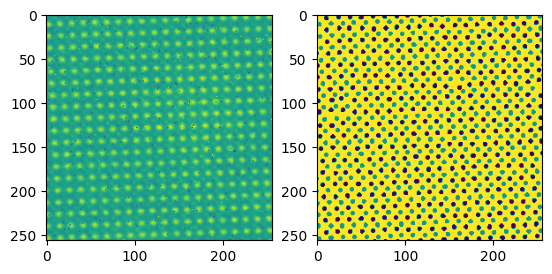

In [ ]:
n = 15

fig, ax = plt.subplots(1, 2)
ax[0].imshow(images[n,0,:,:])
ax[1].imshow(labels[n,:,:])
plt.show()



```
# This is formatted as code
```

## Problem IV.1

IV.1. Create a data set of images and labels by slicing the original training set. For example, you can simply select 64x64 window from both images, labels, images_test and labels_test data sets. Make sure to use different name, so that we keep original data sets for later.

IV.2. Create a neural network that learns to segment the 64x64 images, meaning to predict labels based on inputs.

IV.3. Train the network and explore the training/validation curve.

Now, let's download experimental image.

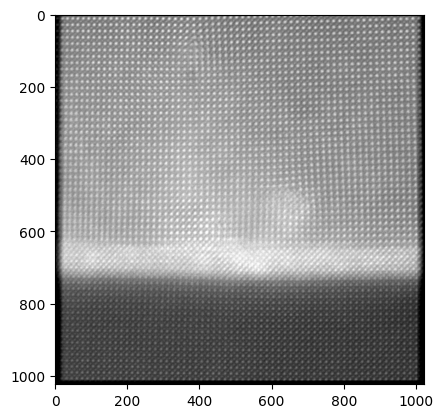

In [ ]:
# Load validation data (data from different experiment)
expdata = plt.imread('bto_atomic.jpg')
plt.imshow(expdata, cmap='gray')

IV.4. Now, select the segment of the image (experiment with resizing and slicing) and see if your network can find atoms on this image.

Now, let's compare the results with the "official" AtomAI solution.

Note that the training/test images and masks represent 4 separate numpy arrays with the dimensions (n_images, n_channels=1, image_height, image_width) for training/test images, and (n_images, image_height, image_width) for the associated masks (aka ground truth). The reason that our images have 4 dimensions, while our labels have only 3 dimensions is because of how the cross-entropy loss is calculated in PyTorch (see [here](https://pytorch.org/docs/stable/nn.html#nllloss)). Briefly, if you have multiple channels corresponding to different classes in your labeled data, you'll need to map your target classes to tensor indices. Here, we already did this for our training and test data during the preparation stage and so everything is ready for training.

Let's plot some of the original training data:

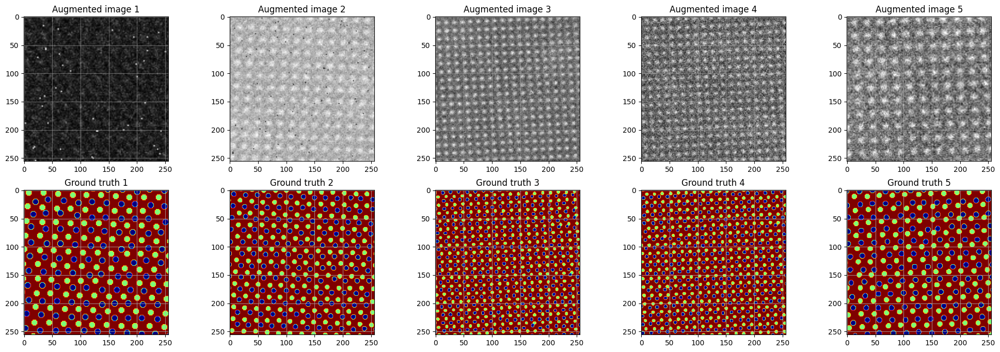

In [ ]:
n = 5 # number of images to plot

n = n + 1
fig = plt.figure( figsize=(30, 8))
for i in range(1, n):
    ax = fig.add_subplot(2, n, i)
    ax.imshow(images[i-1,0,:,:], cmap='gray')
    ax.set_title('Augmented image ' + str(i))
    ax.grid(alpha = 0.5)
    ax = fig.add_subplot(2, n, i+n)
    ax.imshow(labels[i-1], interpolation='Gaussian', cmap='jet')
    ax.set_title('Ground truth ' + str(i))
    ax.grid(alpha=0.75)

The neural network will be trained to take the images in the top row (see plot above) as the input and to output clean images of circular-shaped "blobs" on a uniform background in the bottom row, from which one can identify the xy centers of atoms.

We are going to use a [UNet](https://en.wikipedia.org/wiki/U-Net)-like neural network for semantic segmentation. In the semantic segmentation tasks we aim at categorizing every pixel in the image. This is different form a regular image-level classification tasks, where we categorize the image as whole (e.g. this image has a cat/dog, etc.). Here's a nice illustration from this [free book](https://pytorch.org/assets/deep-learning/Deep-Learning-with-PyTorch.pdf):

<img src="https://drive.google.com/uc?export=view&id=18N4x3P0whH91OcpBOOkDprgWVo-36i34" width=800 px><br><br>

Initialize a nodel for semantic segmentation:

In [ ]:
model = aoi.models.Segmentor(nb_classes=3)

We can also "print" the neural network:

In [ ]:
print(model.net)

Unet(
  (c1): ConvBlock(
    (block): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c2): ConvBlock(
    (block): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): LeakyReLU(negative_slope=0.01)
      (5): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (c3): ConvBlock(
    (block): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.01)
      (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
   

Train the initialized model:

(Here the accuracy is calculated as [Intersection over Union](https://en.wikipedia.org/wiki/Jaccard_index) (IoU) score, which is the area of overlap between the predicted segmentation and the ground truth divided by the area of union between them)

Epoch 1/300 ... Training loss: 1.2846 ... Test loss: 1.2103 ... Train Accuracy: 0.0901 ... Test Accuracy: 0.0405 ... GPU memory usage: 6173/15360
Epoch 100/300 ... Training loss: 0.462 ... Test loss: 0.3966 ... Train Accuracy: 0.6609 ... Test Accuracy: 0.6584 ... GPU memory usage: 7039/15360
Epoch 200/300 ... Training loss: 0.2758 ... Test loss: 0.2481 ... Train Accuracy: 0.7211 ... Test Accuracy: 0.7418 ... GPU memory usage: 7039/15360
Epoch 300/300 ... Training loss: 0.2351 ... Test loss: 0.2208 ... Train Accuracy: 0.7388 ... Test Accuracy: 0.7451 ... GPU memory usage: 7039/15360
Model (final state) evaluation loss: 0.2371
Model (final state) accuracy: 0.7249
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.2334
Model (final state) accuracy: 0.7288
Plotting training history


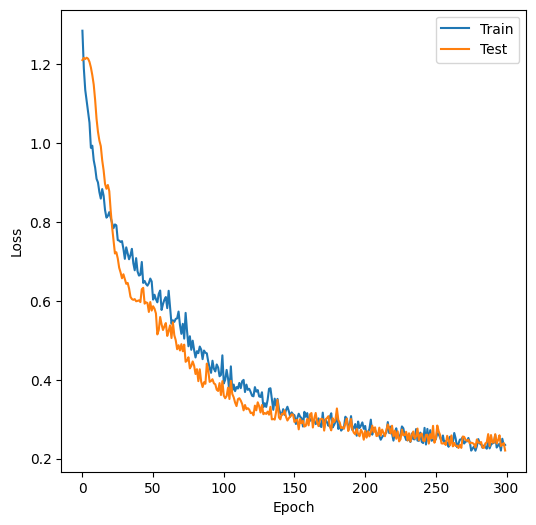

In [ ]:
model.fit(images, labels, images_test, labels_test, # training data
          training_cycles=300, compute_accuracy=True, swa=True # training parameters
)

Now let's make a prediction on the image from a different experiment ( the data is from our paper in *Applied Physics Letters 115, 052902 (2019)* ). Notice that the raw output is a set of semantically segmented blobs (corresponding to different atoms) on a uniform background. We then simply find their centers of the mass, which correspond to the atomic centers (if a network was properly trained).

In [ ]:
nn_output, coordinates = model.predict(expdata)

Batch 1/1
1 image was decoded in approximately 0.1577 seconds


In [ ]:
coordinates[0].shape

(7540, 3)

Plot raw prediction:

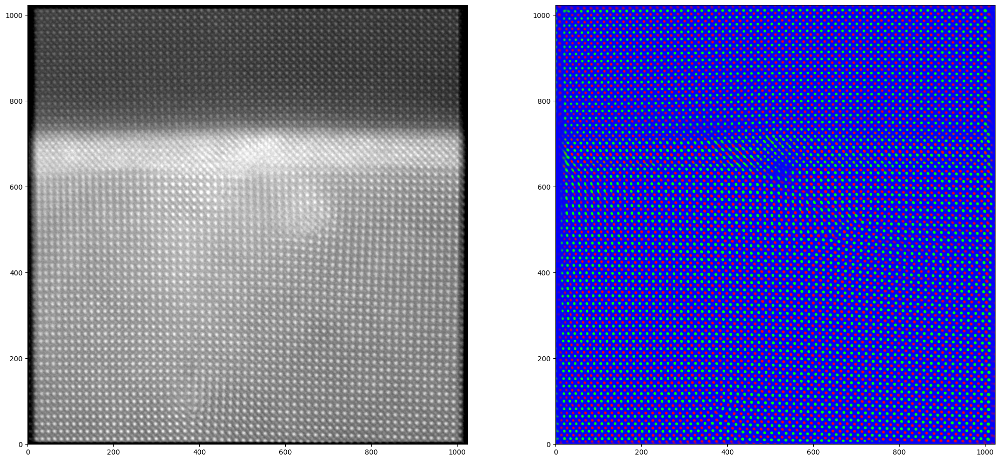

In [ ]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 12))
ax1.imshow(expdata, cmap='gray', origin="lower")
ax2.imshow(nn_output.squeeze(), origin="lower")

Plot atomic coordinates:

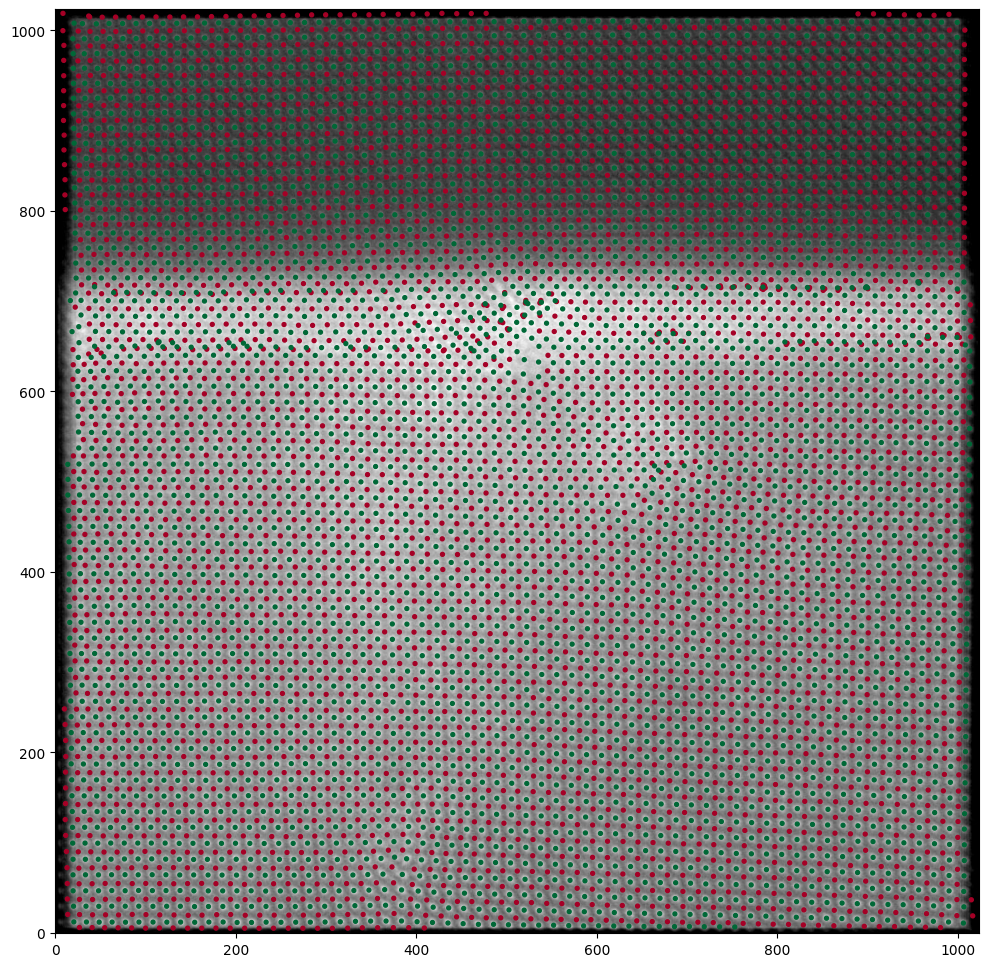

In [ ]:
aoi.utils.plot_coord(expdata, coordinates[0], fsize=12)

Looks like our model performed quite well on the previously unseen data! There is no ground truth for the experimental data, so evaluating accuracy is somewhat tricky, but we can sometimes compare our results with the results of other methods.

Notice that here we analyzed image with resolution of 1024x1024 even though our network was trained only using 256x256 images. That's the beauty of fully convolutional neural networks (i.e. network without full-connected, dense layers) - it is not sensitive to the size of input image as long as it can be divided by $2^{n}$ where n is a number of max-pooling layers in the network. That said, there is always some optimal pixel-to-angstrom ratio (or, roughly, number of pixels per atom/defect) at which a network will generate the best results. It might be a good idea to determine such a ratio and (if possible) make adjustments to the resolution of experimental images.

Finally, please keep in mind that the model was trained onnly on a single image, so it may not be very robust or generalize well enough. However, the procedure for training on the larger and more diverse training set is exactly the same!

## Problem IV.2.

IV.4. Use the log-blob (Laplacian of Gaussian) to find atoms in the image

IV.5. Plot intensity of each atom as a function of position, i.e. make image A(xi, yi), where xi, yi are coordinates of atoms

Note that with this approach, we can identify image patches and perform all the supervised and unsupervised analyses. However, before doing it let's experiment with atom finding using AtomAI neural network we have trained.

## Problem IV.3.

Once we have all atomic coordinates and "cleaned" images we can perform various forms of analysis on local image descriptors. We start by get local descriptors, which are subimages centered on one of the sublattices:

In [ ]:
imstack = aoi.stat.imlocal(nn_output, coordinates, window_size=32, coord_class=1)

In [ ]:
# You can explore what's inside imstack object using the .*?
# imstack.*?

The imstack object encodes functions and methods in AtomAI. For our purposes, let's just create the arrays containign image patches and coordinates that they are taken from.

In [ ]:
imstack.imgstack.shape, imstack.imgstack_com.shape

((3644, 32, 32, 3), (3644, 2))

IV.6. Plot the atoms you have found with log-blob in blue, and with neural network in red. Which method worked better?

IV.7. Use GMM to analyze the image patches,
- plot the class labels, and
- plot the labelled images (i.e. label at coordinates coming from imgstack_com)  

IV.8. Run the PCA analysis. Plot the:
- scree plot
- PCA components
- PCA images (meaning PCA1, PCA2, etc. for location in coordinates)

IV.9. Run similar analysis using variational autoencoder. Visualzie
- latent distribution
- latent representation
- latent images

**IV.10 Congratulations!** As we conclude our final exam, I want to express my sincere admiration for the dedication and hard work you've all shown over the last 3.5 months. Starting from the basics of Python and machine learning, you've progressed remarkably, demonstrating your ability to address a variety of real-world problems, from decision analysis to image and spectrum analysis.

For all of you, your journey is impressive, reflecting not just your commitment to learning but also your potential to apply these skills in practical settings. The field of machine learning is vast and constantly evolving, and while what we've covered is just a glimpse, it's a strong foundation that I hope will be valuable in your current and future endeavors. I really enjoyed discussions with those of you who were bringing real research problems and ideas on ML to brainstorm!

Remember, every expert in any field started as a beginner. The journey in machine learning is continuous, and there's always more to explore and learn. I encourage you to build upon the skills and principles you've learned here, and to keep pushing the boundaries of your knowledge and capabilities.

I am genuinely excited about the prospect of staying in touch. Collaborating on real-world challenges would be a wonderful opportunity to continue our learning journey together.

I will also greatly appreciate you feedback on the course - what can I do to make it better.

Once again, congratulations on completing this course. I'm eager to see where your paths lead in the fascinating world of machine learning and beyond. Please feel free to reach out anytime - I'm here to support and collaborate.

## Answers using AtomAI (for comparison)

This is the "official solution" using AtomAI functions. Once we have all atomic coordinates and "cleaned" images we can perform various forms of analysis on local image descriptors. In the remainder of this notebook, we are going to use AtomAI's *stat* module to get a stack of subimages around one of the atom types and perform different types of statistical analysis on them that would reveal the domain structure and the associated "principal" distortions in an unsupervised manner:

Start by get local descriptors, which are subimages centered on one of the sublattices. Note that the number of this subimages is smaller then numbe rof atoms (since we cannot use the atoms that are closer to edge then windowsize/2)

In [ ]:
imstack = aoi.stat.imlocal(nn_output, coordinates, window_size=32, coord_class=1)

Compute PCA scree plot to estimate the number of components/sources for the multivariate analysis below:

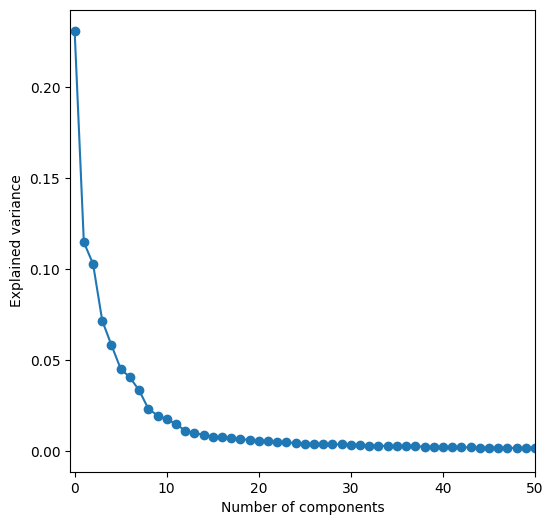

In [ ]:
imstack.pca_scree_plot(plot_results=True);

Do PCA analysis and plot results:

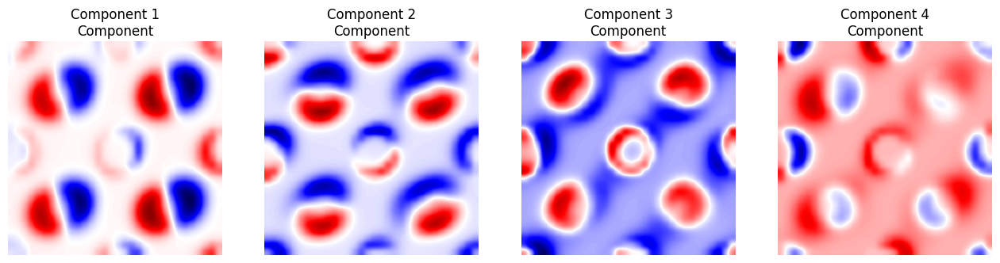

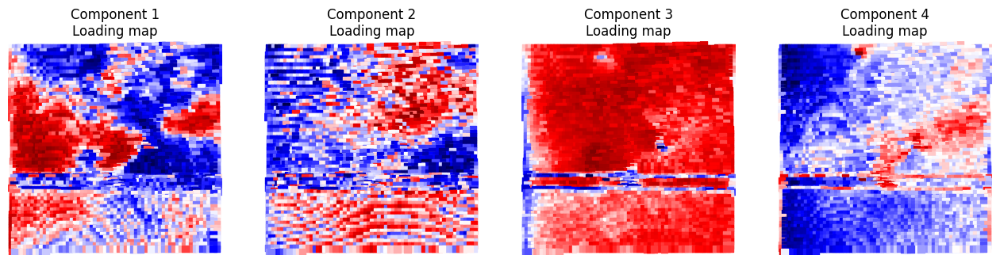

In [ ]:
pca_results = imstack.imblock_pca(4, plot_results=True)

Do ICA analysis and plot results:

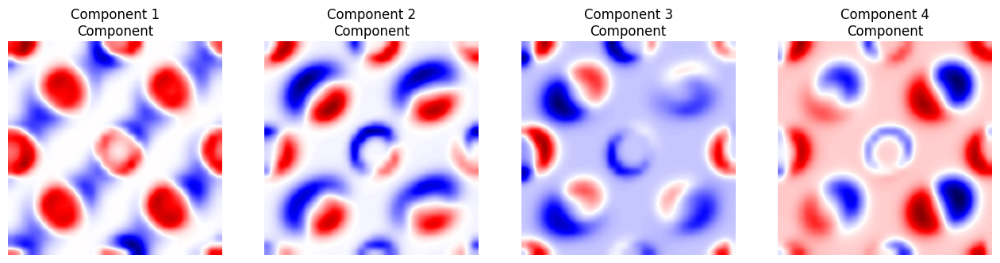

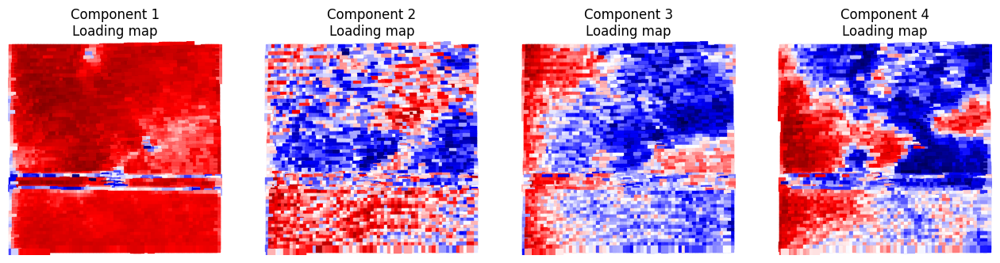

In [ ]:
ica_results = imstack.imblock_ica(4, plot_results=True)

Do NMF analysis and plot results:

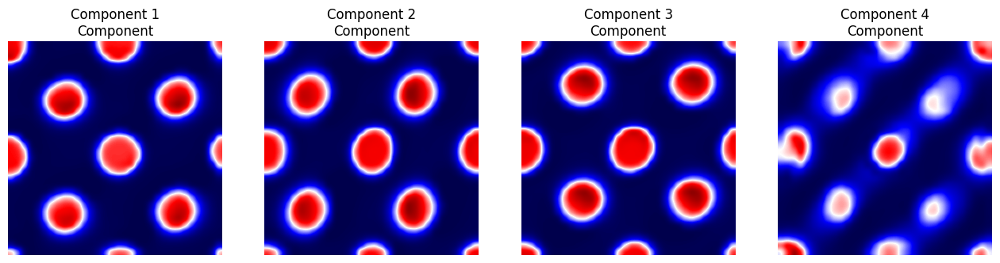

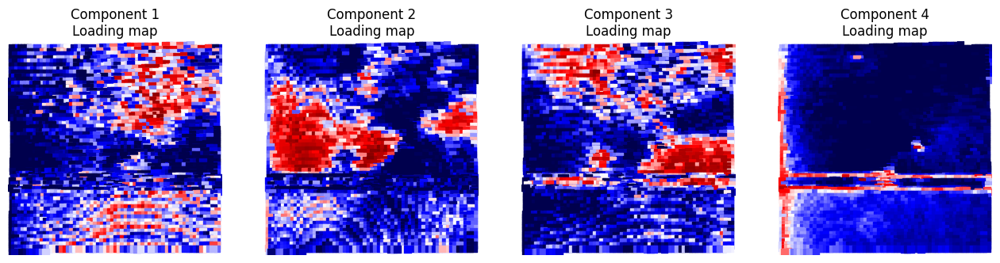

In [ ]:
nmf_results = imstack.imblock_nmf(4, plot_results=True)